In [9]:
%load_ext autoreload
%autoreload 2

import numpy as np
from scipy.signal import argrelextrema

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import pandas as pd
import seaborn as sns
from pylab import cm
import json

import os
import sys
import re
import sympy

import cmath
import matplotlib.patches as patches
from matplotlib import colors as m2colors

import plotly
import plotly.graph_objects as go

cwd = os.getcwd()
# font scale 1.5 usually good with figure sizes ~ 6x6 for visible axes labels
sns.set(style="ticks", font_scale=1.5)

# useful color dictionary: https://matplotlib.org/gallery/color/named_colors.html
mcolors = dict(m2colors.BASE_COLORS, **m2colors.CSS4_COLORS)

saveall = False

print(plotly.__version__)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
4.11.0


In [4]:
## define some functions (usually put these in a separate .py file to simplify editing)

def U(fm, m, x, a, params):
    
    return -fm(m, params)*x + x**2/(2*params['tau']) - a/(params['n']+1)*x**(params['n']+1) * scipy.special.hyp2f1(1, (params['n']+1)/params['n'], (2*params['n']+1)/params['n'], -x**params['n'])

def x_crit(n):
    return ((n-1)/(n+1))**(1/n)

def alpha_crit(n, tau):
    return 4*n/(tau*(n-1)**((n-1)/n)*(n+1)**((n+1)/n))

def m_crit(n, tau, m0):
    return -m0*np.log(1 - (( (n-1)/(n+1))**(1/n) ) * (1/tau-2/(n+1)))

def m_crit_over_m0(n, tau):
    # stiff only
    return -np.log(1 - ( ((n-1)/(n+1))**(1/n) ) * (1/tau-2/(n+1)))

def m_crit_general(mc, params):
    # general to f(m)
    return ( (f_m(mc, params) - params['x_c']/params['tau'] + params['a_c'] * params['x_c']**params['n']/(params['x_c']**params['n']+1)) ) 

def f_m(m, params):
    if params['type'] == 'stiff':
        return 1 - np.exp(-m/params['m0'])
    if params['type'] == 'soft':
        return 1 - np.exp(-params['m0']/m)

def x_equil(x, m, alpha, params): 
#     x = vs
    return ( f_m(m, params) - x/params['tau'] + alpha * x**params['n']/(x**params['n']+1) )

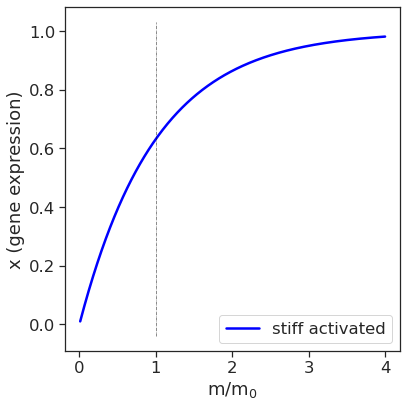

In [5]:
## figure 1
## home directory is the project directory, make a subdirectory 'figures'

# read or generate data for the plot. often just use plain python and run from the command line as well instead of jupyter.
Nt = 500
x_space = np.linspace(0,3,Nt)
m0 = 1.
m = np.linspace(0.01,4,Nt)
fm = 1-np.exp(-m/m0)

fig, ax = plt.subplots(1,1, figsize=(6,6))
ax.plot(m/m0, fm, color = 'blue', linewidth=2.5, label='stiff activated')
ax.set_xlabel('m/m$_{0}$')
ax.set_ylabel('x (gene expression)')

ax.plot([1., 1.], ax.get_ylim(), color = 'k', linestyle = '-.', linewidth=0.5)

ax.legend(loc=4)

plt.tight_layout()

# Uvals =  U(fm, x, a, tau, n)

if saveall:
    direc = os.getcwd() + '/figures/figure1/'

    fname1 = direc + "stiff_only_activations_v1.png"
    print(fname1)
    fig.savefig(fname1, format='png', dpi=600)



In [11]:
### figure 2
### example of 3D plotting using plotly


### data generation
res = 500

x_space = np.linspace(-3, 3, res)
a_space = np.linspace(10, 170, res)

a0 = 0.1
B = -2
g = 0.7
a_c = 150
a_stop = 40

Wscape = np.zeros((res,res))

m1coords = []
m2coords = []

for ai, aa in enumerate(a_space):
    f0 = -aa**2 * 0.0001
    if aa <= a_c:
        add = np.abs(aa-a_c)/5
    else:
        add = 0.
        
    if aa <= a_stop:
        aa = a_stop
        add = np.abs(a_stop-a_c)/5

    Wscape[ai,:] = add + f0 + a0 * (aa-a_c) * x_space**2 + B/2*(x_space)**4 + 1/3*g*x_space**6
    
    wargs = argrelextrema(np.abs(np.diff(Wscape[ai,:])), np.less)[0]
    x_mins = x_space[wargs]
    
    ## save some points to highlight (minima)
    if aa <= 111:
        m1coords.append([np.amin(x_mins), a_space[ai], Wscape[ai, np.amin(wargs)]])
        m2coords.append([np.amax(x_mins), a_space[ai], Wscape[ai, np.amax(wargs)]])

m1coords = np.array(m1coords); 
m2coords = np.array(m2coords)        
##### end data generation

### start plotting. setup figure with surface plot
fig = go.Figure(data=[go.Surface(z=Wscape, x=x_space, y=a_space, colorscale='cividis', 
                                 cmin=np.amin(Wscape), cmax=np.amax(Wscape[-1:])/10)],
               layout = go.Layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
               )

### add some contour lines to the bottom
fig.update_traces(contours_z=dict(show=True, usecolormap=False,
                                  project_z=False, start=np.amin(Wscape), 
                                  end=np.amax(Wscape), color='black', size=1.5))


### add scatters of highlighted points
fig.add_scatter3d(x=m1coords[:,0], y=m1coords[:,1], z=m1coords[:,2]+0.05, mode='markers', showlegend=False,
                  marker=dict(size=4, color='blueviolet'))
fig.add_scatter3d(x=m2coords[:,0], y=m2coords[:,1], z=m2coords[:,2]+0.05, mode='markers', showlegend=False,
                  marker=dict(size=4, color='dodgerblue'))

## adjust labels and titles, ticks, whether the graph backboard is visible, etc.
fig.update_layout(title='Waddington Landscape', autosize=True, scene=dict(
                    xaxis = dict(
                        title='<b>x</b>',
                        titlefont=dict(family='Cambria', size=22), showticklabels=False
                    ),
                    yaxis = dict(
                        title='<b>\u03b1</b>',titlefont=dict(family='Cambria', size=22), visible=False, showgrid=False, showticklabels=False
                    ),
                    zaxis = dict(
                        title='W', range=[np.amin(Wscape)*1.05, np.amax(Wscape[-1:])/10],
                        titlefont=dict(family='Cambria', size=24), showticklabels=False,
                    ),
                    ),
                  width=650, height=650,
                  margin=dict(l=50, r=50, b=50, t=50),
                  font=dict(family='Cambria', size=16, color='#7f7f7f'),

### adjust the viewpoint (useful for automatic saving)
                  scene_camera = dict(up = dict(x=0,y=0,z=1), 
                                      center = dict(x=0, y=0, z=0), 
                                      eye = dict(x=0, y=-1.5, z=1.5))
                  
                  )


fig.show()


saveall = False
if saveall:
    direc = os.getcwd() + '/figures/figure2/'    
    fname1 = direc + "sample_waddington_v3.png"
    fig.write_image(fname1, scale = 1.5, engine='kaleido')